# Spoint tutorial: Deconvolution of cell types distribution of spatial transcriptomics

September 2022

Dataset: Visium slices of human dorsolateral prefrontal cortex ([here](#)).

In [1]:
from SPACEL.setting import set_environ_seed, auto_cuda_device

auto_cuda_device()
set_environ_seed()

from SPACEL import Spoint
import scanpy as sc
import numpy as np
from scipy.sparse import csr_matrix
import matplotlib
import seaborn as sns
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
matplotlib.rcParams['font.serif'] = ['Arial']
sc.settings.set_figure_params(dpi=50,dpi_save=300,facecolor='white',fontsize=10,vector_friendly=True,figsize=(3,3))
sc.settings.verbosity = 3

Using GPU: 3
Setting environment seed: 42


2022-10-14 19:51:59.540939: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
Global seed set to 0
/home/qukun/xuhao/miniconda3/envs/SPACEL/lib/python3.8/site-packages/numba/np/ufunc/parallel.py:365: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 6103. The TBB threading layer is disabled.
  warnings.warn(problem)


## Load spatial transcriptomics data

The input data are anndata objects stored raw counts for scRNA-seq and ST. The scRNA-seq anndata must have cell type annotation in `.obs`.

In [2]:
sc_ad = sc.read_h5ad('../data/visium_human_DLPFC/human_mtg_snrna_norm_by_exon.h5ad')
st_ad = sc.read_h5ad('../data/visium_human_DLPFC/spatial_151676.h5ad')

sc.pp.filter_genes(st_ad,min_cells=1)
sc.pp.filter_genes(sc_ad,min_cells=1)
sc.pp.filter_cells(st_ad,min_genes=1)
sc.pp.filter_cells(sc_ad,min_genes=1)

filtered out 12226 genes that are detected in less than 1 cells
filtered out 32 genes that are detected in less than 1 cells


In this step, we initialize Spoint model with anndata objects for scRNA-seq and ST as input. The parameter `celltype_key` is the column name of cell type annotation in `.obs`. The parameter `sm_size` controls the number of simulated spots.

In [3]:
Spoint = Spoint.init_model(sc_ad,st_ad,celltype_key='cluster_label',sm_size=500000)

Setting global seed: 42


2022-10-14 19:54:23.065509: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2022-10-14 19:54:23.455216: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:09:00.0 name: Tesla K80 computeCapability: 3.7
coreClock: 0.8235GHz coreCount: 13 deviceMemorySize: 11.17GiB deviceMemoryBandwidth: 223.96GiB/s
2022-10-14 19:54:23.467127: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2022-10-14 19:54:23.470441: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10
2022-10-14 19:54:23.683180: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcufft.so.10
2022-10-14 19:54:23.820836: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcurand.so.10
2022-

normalizing counts per cell
    finished (0:00:01)
normalizing counts per cell
    finished (0:00:00)
### Finding marker genes...
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:07:09)
Astro L1 FGFR3 FOS       200
Inh L1-3 PAX6 NABP1      200
Inh L1-6 VIP PENK        200
Inh L1-6 PVALB SCUBE3    200
Inh L1-6 LAMP5 CA13      200
                        ... 
Peri L1-6 MUSTN1         133
Inh L1-2 VIP PPAPDC1A    128
Inh L1 ADARB2 DISP2       67
Inh L1-2 PVALB TAC1       67
VLMC L1-3 CYP1B1          39
Name: cluster_label, Length: 119, dtype: int64
### Used gene numbers: 4956
### Initializing sample probability
### Genetating simulated spatial data using scRNA data w

2022-10-14 20:09:48.986493: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN)to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-14 20:09:49.939765: I tensorflow/core/platform/profile_utils/cpu_utils.cc:104] CPU Frequency: 2399770000 Hz
2022-10-14 20:09:49.956555: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x2b129fccf3c0 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
2022-10-14 20:09:49.956607: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): Host, Default Version
2022-10-14 20:09:50.133588: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x2b129fa7f640 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2022-10-14 20:09:50.133697: 

Here, we train the model to obtain the best model for cell type deconvolution. The parameter "max_steps" is the maximum number of steps in the training process. Generally, the model will stop training before reaching the maximum number of steps.

In [4]:
Spoint.train(max_steps=5000)

/home/qukun/xuhao/miniconda3/envs/SPACEL/lib/python3.8/site-packages/anndata/_core/merge.py:915: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


INFO     Using batches from adata.obs["batch"]                                                                     
INFO     No label_key inputted, assuming all cells have same label                                                 
INFO     Using data from adata.layers["counts"]                                                                    
INFO     Successfully registered anndata object containing 503458 cells, 4956 vars, 2 batches, 1 labels, and 0     
         proteins. Also registered 0 extra categorical covariates and 0 extra continuous covariates.               
INFO     Please do not further modify adata until model is trained.                                                


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


Epoch 100/100: 100%|██████████| 100/100 [42:38<00:00, 25.58s/it, loss=1.62e+03, v_num=1]


2022-10-14 20:54:14.066989: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10


### Update best model
Step 1 - loss: 3.464
### Update best model
Step 11 - loss: 3.131
### Update best model
Step 21 - loss: 2.987
### Update best model
Step 31 - loss: 2.824
### Update best model
Step 41 - loss: 2.622
### Update best model
Step 51 - loss: 2.432
### Update best model
Step 61 - loss: 2.233
### Update best model
Step 71 - loss: 2.065
### Update best model
Step 81 - loss: 1.960
### Update best model
Step 91 - loss: 1.837
### Update best model
Step 101 - loss: 1.692
### Update best model
Step 111 - loss: 1.583
### Update best model
Step 121 - loss: 1.499
### Update best model
Step 131 - loss: 1.434
### Update best model
Step 141 - loss: 1.376
### Update best model
Step 151 - loss: 1.332
### Update best model
Step 161 - loss: 1.307
### Update best model
Step 171 - loss: 1.275
Step 181 - loss: 1.314
### Update best model
Step 191 - loss: 1.268
### Update best model
Step 201 - loss: 1.234
### Update best model
Step 211 - loss: 1.211
### Update best model
Step 221 - loss: 1.19

Then, we use the trained model to predict the cell type composition of each spot in ST. It will return a `DataFrame` object, where each row represents a spot in ST, each column represents a cell type in scRNA-seq, and each item represents the proportion of a cell type in a spot. Also, we can get the anndata of the ST of the data frame with the deconvolution result embedded in `.obs`.

In [5]:
pre = Spoint.deconv_spatial()

In [6]:
st_ad = Spoint.st_ad

We can see the result of deconvolution in the ST slice.

... storing 'batch' as categorical


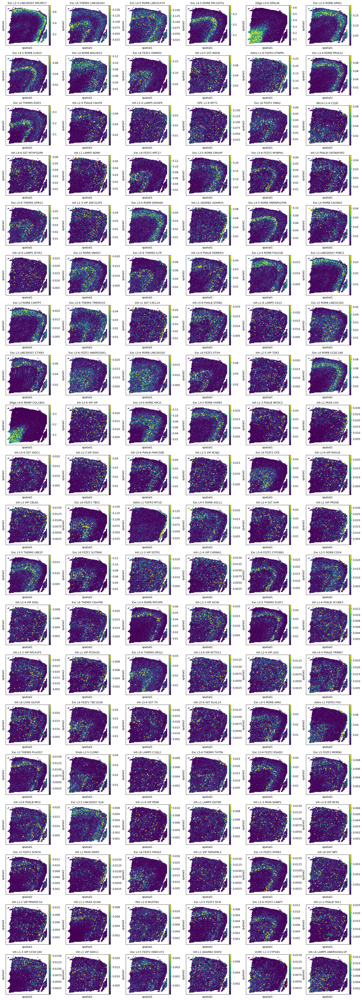

In [7]:
sc.pl.embedding(st_ad,color=pre.columns,basis='spatial',ncols=6,vmax='p99')